## Copyright 2022 Google LLC. Double-click for license information.

In [1]:
# Copyright 2022 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Prompt-to-Prompt with Stable Diffusion

In [2]:
from typing import Optional, Union, Tuple, List, Callable, Dict
import torch
from diffusers import StableDiffusionPipeline
import torch.nn.functional as nnf
import numpy as np
import abc
import _ptp_utils as ptp_utils
import _seq_aligner as seq_aligner

In [3]:
# for adapt CustomDiffusion. 
import argparse
import sys
import os
import numpy as np
import torch
from PIL import Image
import pdb

from src.diffusers_model_pipeline import CustomDiffusionPipeline, CustomDiffusionXLPipeline

In [4]:
import numpy as np
np.set_printoptions(edgeitems=30, linewidth=100000, 
    formatter=dict(float=lambda x: "%.3g" % x))

For loading the Stable Diffusion using Diffusers, follow the instuctions https://huggingface.co/blog/stable_diffusion and update ```MY_TOKEN``` with your token.
Set ```LOW_RESOURCE``` to ```True``` for running on 12GB GPU.

In [5]:
# MY_TOKEN = '<replace with your token>'
# LOW_RESOURCE = False 
# NUM_DIFFUSION_STEPS = 50
# GUIDANCE_SCALE = 7.5
# MAX_NUM_WORDS = 77
# device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
# ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", use_auth_token=MY_TOKEN).to(device)
# tokenizer = ldm_stable.tokenizer

## Prompt-to-Prompt Attnetion Controllers
Our main logic is implemented in the `forward` call in an `AttentionControl` object.
The forward is called in each attention layer of the diffusion model and it can modify the input attnetion weights `attn`.

`is_cross`, `place_in_unet in ("down", "mid", "up")`, `AttentionControl.cur_step` help us track the exact attention layer and timestamp during the diffusion iference.


In [6]:
class LocalBlend:

    def __call__(self, x_t, attention_store):
        k = 1
        maps = attention_store["down_cross"][2:4] + attention_store["up_cross"][:3]
        maps = [item.reshape(self.alpha_layers.shape[0], -1, 1, 16, 16, MAX_NUM_WORDS) for item in maps]
        maps = torch.cat(maps, dim=1)
        maps = (maps * self.alpha_layers).sum(-1).mean(1)
        mask = nnf.max_pool2d(maps, (k * 2 + 1, k * 2 +1), (1, 1), padding=(k, k))
        mask = nnf.interpolate(mask, size=(x_t.shape[2:]))
        mask = mask / mask.max(2, keepdims=True)[0].max(3, keepdims=True)[0]
        mask = mask.gt(self.threshold)
        mask = (mask[:1] + mask[1:]).float()
        x_t = x_t[:1] + mask * (x_t - x_t[:1])
        return x_t
       
    def __init__(self, prompts: List[str], words: [List[List[str]]], threshold=.3):
        alpha_layers = torch.zeros(len(prompts),  1, 1, 1, 1, MAX_NUM_WORDS)
        for i, (prompt, words_) in enumerate(zip(prompts, words)):
            if type(words_) is str:
                words_ = [words_]
            for word in words_:
                ind = ptp_utils.get_word_inds(prompt, word, tokenizer)
                alpha_layers[i, :, :, :, :, ind] = 1
        self.alpha_layers = alpha_layers.to(device)
        self.threshold = threshold


class AttentionControl(abc.ABC):
    
    def step_callback(self, x_t):
        return x_t
    
    def between_steps(self):
        return
    
    @property
    def num_uncond_att_layers(self):
        return self.num_att_layers if LOW_RESOURCE else 0
    
    @abc.abstractmethod
    def forward (self, attn, is_cross: bool, place_in_unet: str):
        raise NotImplementedError

    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        if self.cur_att_layer >= self.num_uncond_att_layers:
            if LOW_RESOURCE:
                attn = self.forward(attn, is_cross, place_in_unet)
            else:
                h = attn.shape[0]
                attn[h // 2:] = self.forward(attn[h // 2:], is_cross, place_in_unet)
        self.cur_att_layer += 1
        if self.cur_att_layer == self.num_att_layers + self.num_uncond_att_layers:
            self.cur_att_layer = 0
            self.cur_step += 1
            self.between_steps()
        return attn
    
    def reset(self):
        self.cur_step = 0
        self.cur_att_layer = 0

    def __init__(self):
        self.cur_step = 0
        self.num_att_layers = -1
        self.cur_att_layer = 0

class EmptyControl(AttentionControl):
    
    def forward (self, attn, is_cross: bool, place_in_unet: str):
        return attn
    
    
class AttentionStore(AttentionControl):

    @staticmethod
    def get_empty_store():
        return {"down_cross": [], "mid_cross": [], "up_cross": [],
                "down_self": [],  "mid_self": [],  "up_self": []}

    def forward(self, attn, is_cross: bool, place_in_unet: str):
        key = f"{place_in_unet}_{'cross' if is_cross else 'self'}"
        if attn.shape[1] <= 32 ** 2:  # avoid memory overhead
            self.step_store[key].append(attn)
        return attn

    def between_steps(self):
        if len(self.attention_store) == 0:
            self.attention_store = self.step_store
        else:
            for key in self.attention_store:
                for i in range(len(self.attention_store[key])):
                    self.attention_store[key][i] += self.step_store[key][i]
        self.step_store = self.get_empty_store()

    def get_average_attention(self):
        average_attention = {key: [item / self.cur_step for item in self.attention_store[key]] for key in self.attention_store}
        return average_attention


    def reset(self):
        super(AttentionStore, self).reset()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

    def __init__(self):
        super(AttentionStore, self).__init__()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

        
class AttentionControlEdit(AttentionStore, abc.ABC):
    
    def step_callback(self, x_t):
        if self.local_blend is not None:
            x_t = self.local_blend(x_t, self.attention_store)
        return x_t
        
    def replace_self_attention(self, attn_base, att_replace):
        if att_replace.shape[2] <= 16 ** 2:
            return attn_base.unsqueeze(0).expand(att_replace.shape[0], *attn_base.shape)
        else:
            return att_replace
    
    @abc.abstractmethod
    def replace_cross_attention(self, attn_base, att_replace):
        raise NotImplementedError
    
    def forward(self, attn, is_cross: bool, place_in_unet: str):
        super(AttentionControlEdit, self).forward(attn, is_cross, place_in_unet)
        if is_cross or (self.num_self_replace[0] <= self.cur_step < self.num_self_replace[1]):
            h = attn.shape[0] // (self.batch_size)
            attn = attn.reshape(self.batch_size, h, *attn.shape[1:])
            attn_base, attn_repalce = attn[0], attn[1:]
            if is_cross:
                alpha_words = self.cross_replace_alpha[self.cur_step]
                attn_repalce_new = self.replace_cross_attention(attn_base, attn_repalce) * alpha_words + (1 - alpha_words) * attn_repalce
                attn[1:] = attn_repalce_new
            else:
                attn[1:] = self.replace_self_attention(attn_base, attn_repalce)
            attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
        return attn
    
    def __init__(self, prompts, num_steps: int,
                 cross_replace_steps: Union[float, Tuple[float, float], Dict[str, Tuple[float, float]]],
                 self_replace_steps: Union[float, Tuple[float, float]],
                 local_blend: Optional[LocalBlend]):
        super(AttentionControlEdit, self).__init__()
        self.batch_size = len(prompts)
        self.cross_replace_alpha = ptp_utils.get_time_words_attention_alpha(prompts, num_steps, cross_replace_steps, tokenizer).to(device)
        if type(self_replace_steps) is float:
            self_replace_steps = 0, self_replace_steps
        self.num_self_replace = int(num_steps * self_replace_steps[0]), int(num_steps * self_replace_steps[1])
        self.local_blend = local_blend

class AttentionReplace(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        # print("type(self.mapper)", end=" ")
        # print(type(self.mapper))
        # print("type(attn_base)", end=" ")
        # print(type(attn_base))
        # self.mapper = self.mapper.to(torch.float16)
        # attn_base = attn_base.to(torch.float16)
        return torch.einsum('hpw,bwn->bhpn', attn_base, self.mapper)
      
    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None):
        super(AttentionReplace, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper = seq_aligner.get_replacement_mapper(prompts, tokenizer).to(device)
        

class AttentionRefine(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        attn_base_replace = attn_base[:, :, self.mapper].permute(2, 0, 1, 3)
        attn_replace = attn_base_replace * self.alphas + att_replace * (1 - self.alphas)
        return attn_replace

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None):
        super(AttentionRefine, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper, alphas = seq_aligner.get_refinement_mapper(prompts, tokenizer)
        self.mapper, alphas = self.mapper.to(device), alphas.to(device)
        self.alphas = alphas.reshape(alphas.shape[0], 1, 1, alphas.shape[1])


class AttentionReweight(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        if self.prev_controller is not None:
            attn_base = self.prev_controller.replace_cross_attention(attn_base, att_replace)
        attn_replace = attn_base[None, :, :, :] * self.equalizer[:, None, None, :]
        return attn_replace

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float, equalizer,
                local_blend: Optional[LocalBlend] = None, controller: Optional[AttentionControlEdit] = None):
        super(AttentionReweight, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.equalizer = equalizer.to(device)
        self.prev_controller = controller


def get_equalizer(text: str, word_select: Union[int, Tuple[int, ...]], values: Union[List[float],
                  Tuple[float, ...]]):
    if type(word_select) is int or type(word_select) is str:
        word_select = (word_select,)
    equalizer = torch.ones(len(values), 77)
    values = torch.tensor(values, dtype=torch.float32)
    for word in word_select:
        inds = ptp_utils.get_word_inds(text, word, tokenizer)
        equalizer[:, inds] = values
    return equalizer


In [7]:
from PIL import Image

def aggregate_attention(attention_store: AttentionStore, res: int, from_where: List[str], is_cross: bool, select: int):
    out = []
    attention_maps = attention_store.get_average_attention()
    num_pixels = res ** 2
    for location in from_where:
        for item in attention_maps[f"{location}_{'cross' if is_cross else 'self'}"]:
            if item.shape[1] == num_pixels:
                cross_maps = item.reshape(len(prompts), -1, res, res, item.shape[-1])[select]
                out.append(cross_maps)
    out = torch.cat(out, dim=0)
    out = out.sum(0) / out.shape[0]
    return out.cpu()


def show_cross_attention(attention_store: AttentionStore, res: int, from_where: List[str], select: int = 0):
    tokens = tokenizer.encode(prompts[select])
    decoder = tokenizer.decode
    attention_maps = aggregate_attention(attention_store, res, from_where, True, select)
    images = []
    for i in range(len(tokens)):
        image = attention_maps[:, :, i]
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        image = ptp_utils.text_under_image(image, decoder(int(tokens[i])))
        images.append(image)
    ptp_utils.view_images(np.stack(images, axis=0))
    

def show_self_attention_comp(attention_store: AttentionStore, res: int, from_where: List[str],
                        max_com=10, select: int = 0):
    attention_maps = aggregate_attention(attention_store, res, from_where, False, select).numpy().reshape((res ** 2, res ** 2))
    u, s, vh = np.linalg.svd(attention_maps - np.mean(attention_maps, axis=1, keepdims=True))
    images = []
    for i in range(max_com):
        image = vh[i].reshape(res, res)
        image = image - image.min()
        image = 255 * image / image.max()
        image = np.repeat(np.expand_dims(image, axis=2), 3, axis=2).astype(np.uint8)
        image = Image.fromarray(image).resize((256, 256))
        image = np.array(image)
        images.append(image)
    ptp_utils.view_images(np.concatenate(images, axis=1))

In [8]:
def run_and_display(prompts, controller, latent=None, run_baseline=False, generator=None, path="./_latent_add_out/basic_setting/original_full.jpg"):
    if run_baseline:
        print("w.o. prompt-to-prompt")
        images, latent = run_and_display(prompts, EmptyControl(), latent=latent, run_baseline=False, generator=generator)
        # above run_baseline should be false all the time! 
        print("with prompt-to-prompt")
    images, x_t = ptp_utils.text2image_ldm_stable(ldm_stable, prompts, controller, latent=latent, num_inference_steps=NUM_DIFFUSION_STEPS, guidance_scale=GUIDANCE_SCALE, generator=generator, low_resource=LOW_RESOURCE)
    ptp_utils.view_images(images)
    ptp_utils.store_image(images, path)
    return images, x_t

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

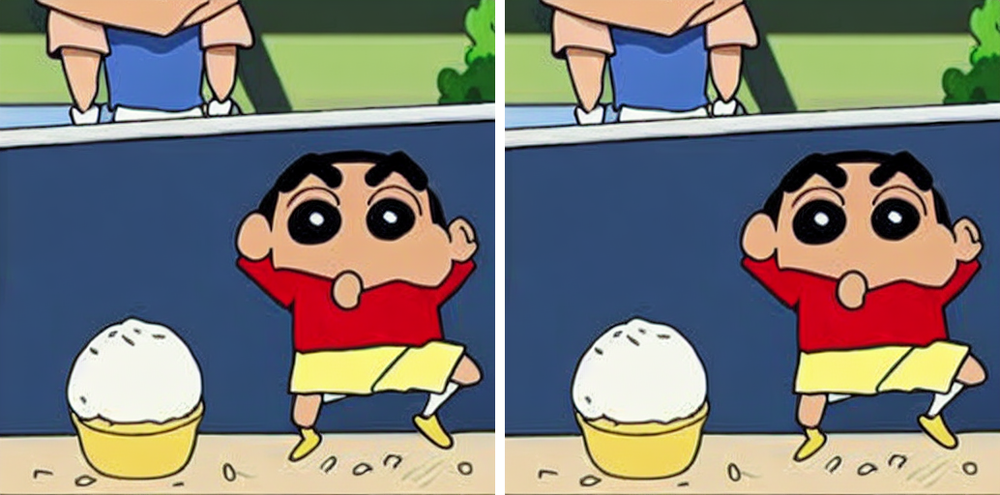

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

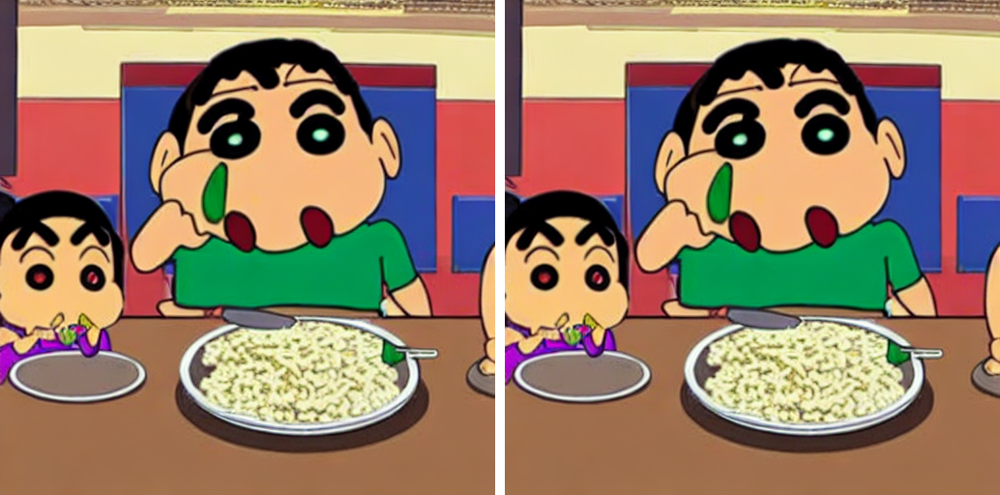

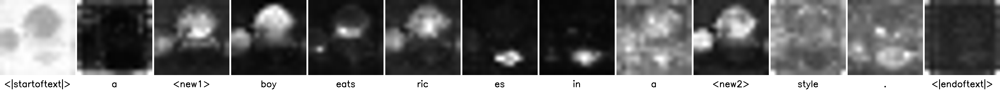

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

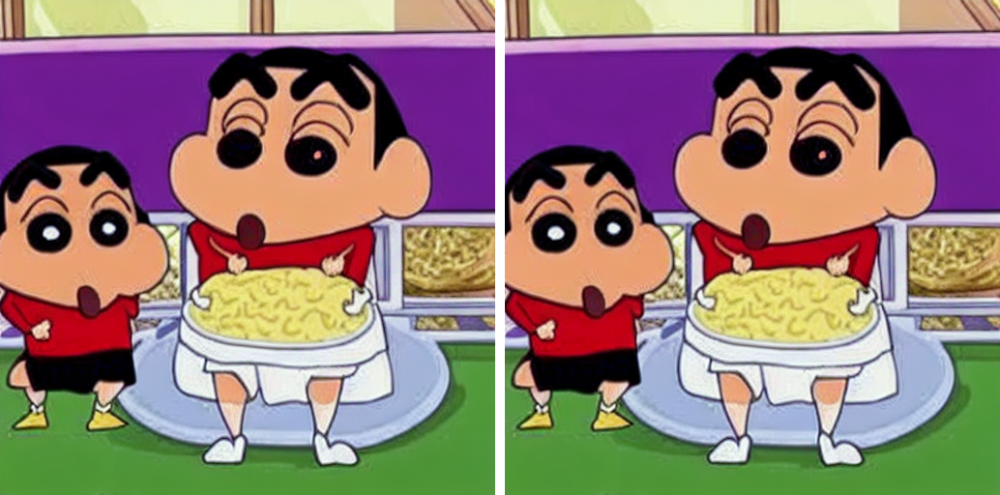

In [10]:
### [run1] # basic setting # latent=None, generator=None, controller.attn_store = controller1.attn_store

# DO NOT EREASE
## 마지막 cross attention 을 섞은 것을 진행했을 때 g_cpu를 고정하지 않는다면 결과가 다르게 나온다. 


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=None, run_baseline=False)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

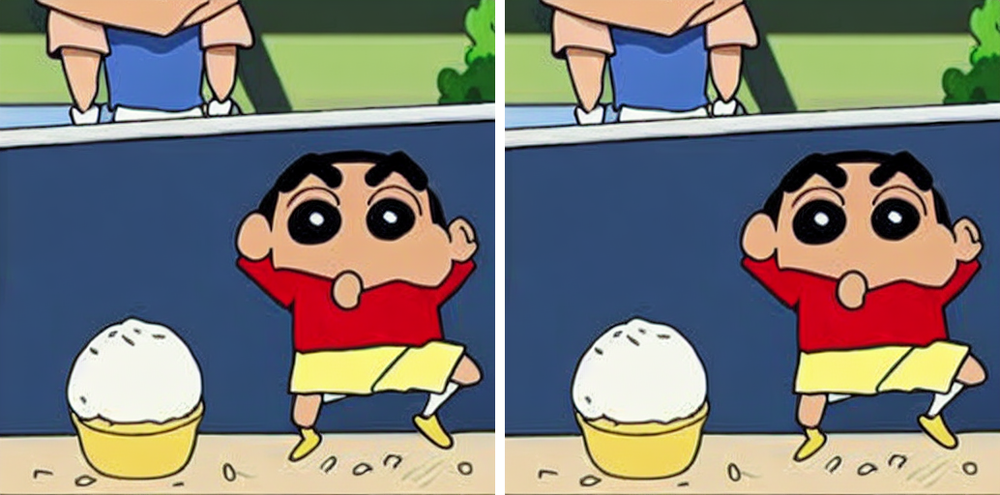

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

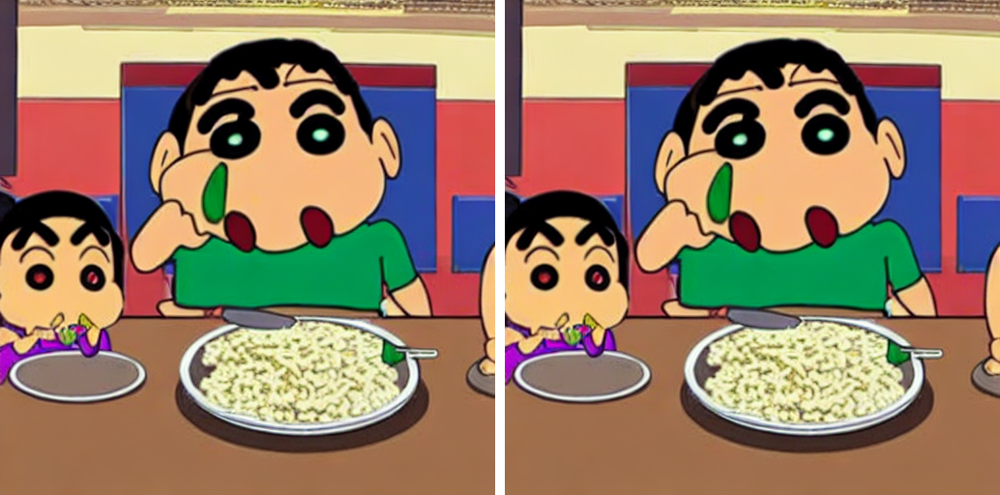

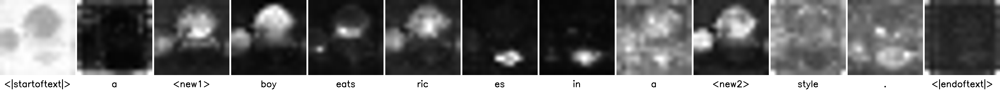

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

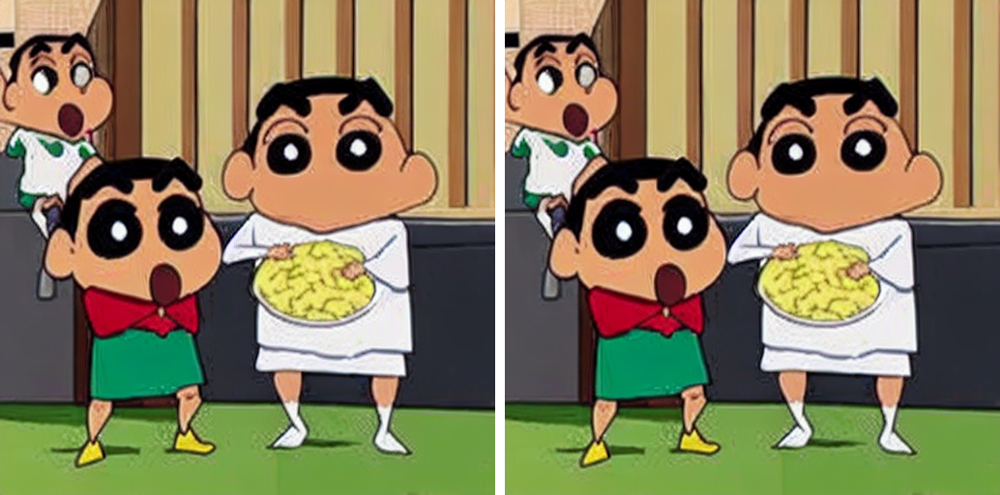

In [13]:
### [run2] # latent=None, generator = g_cpu, controller.attn_store = controller1.attn_store

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:96: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (1, model.unet.in_channels, height // 8, width // 8),
/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:99: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = latent.expand(batch_size,  model.unet.in_channels, height // 8, width // 8).to(model.device)


  0%|          | 0/201 [00:00<?, ?it/s]

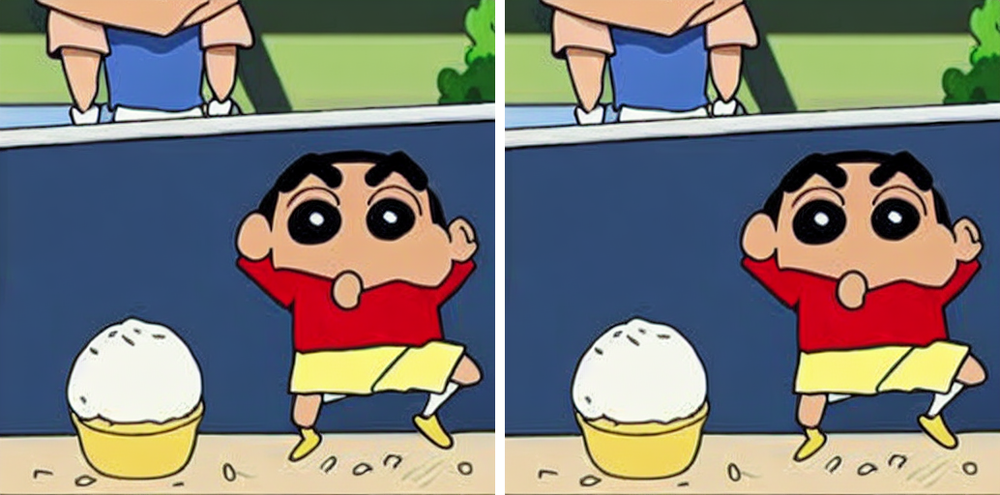

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

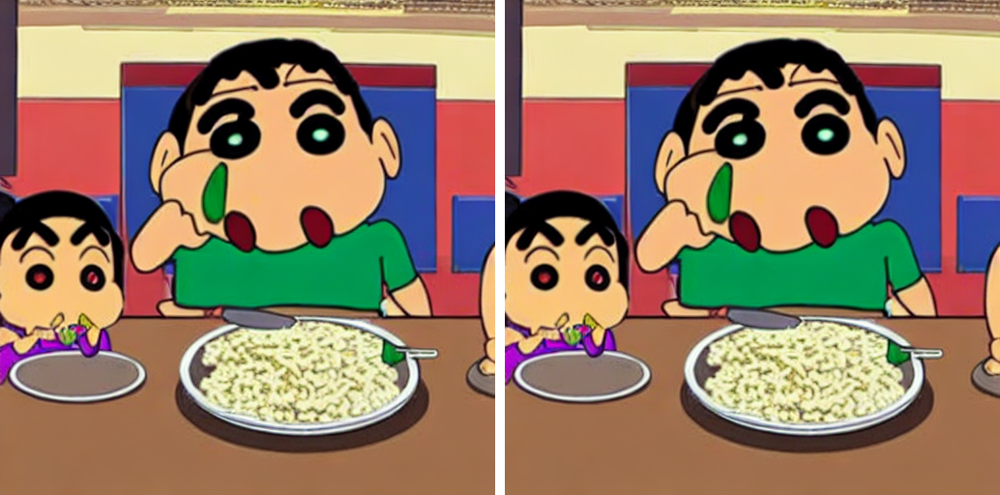

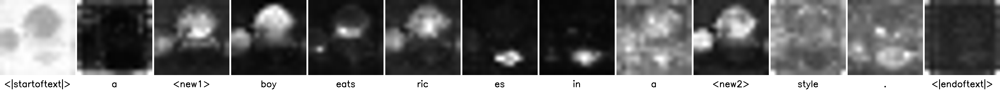

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

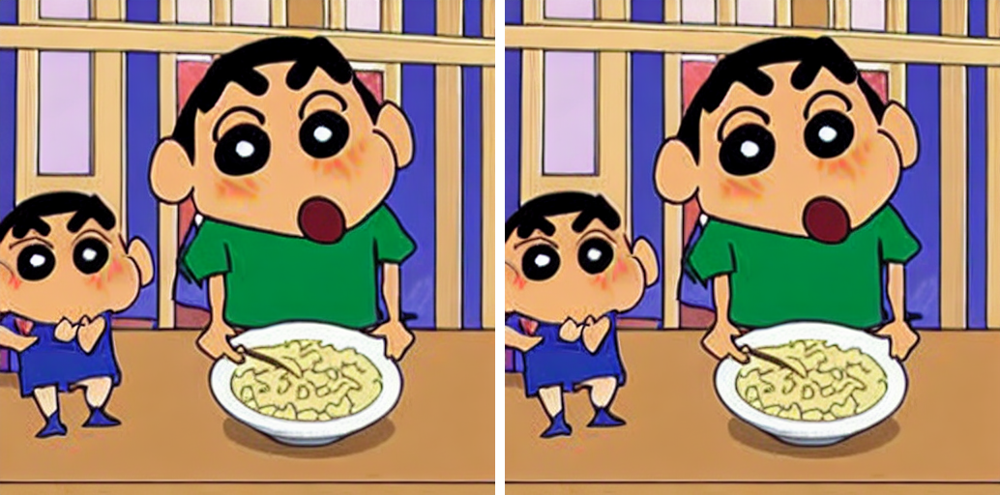

In [14]:
### [run3] # latent=x_t, generator = g_cpu, controller.attn_store = controller1.attn_store #### Reproduction Success!!

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

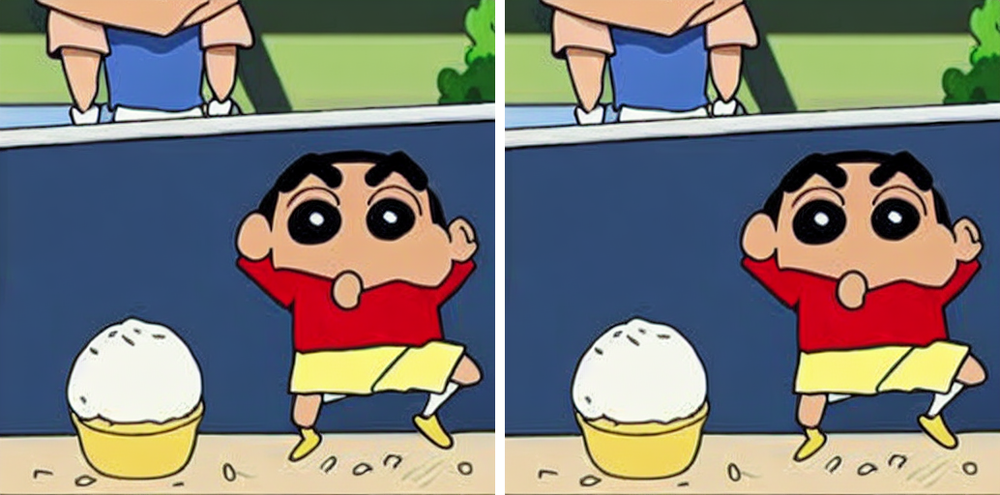

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

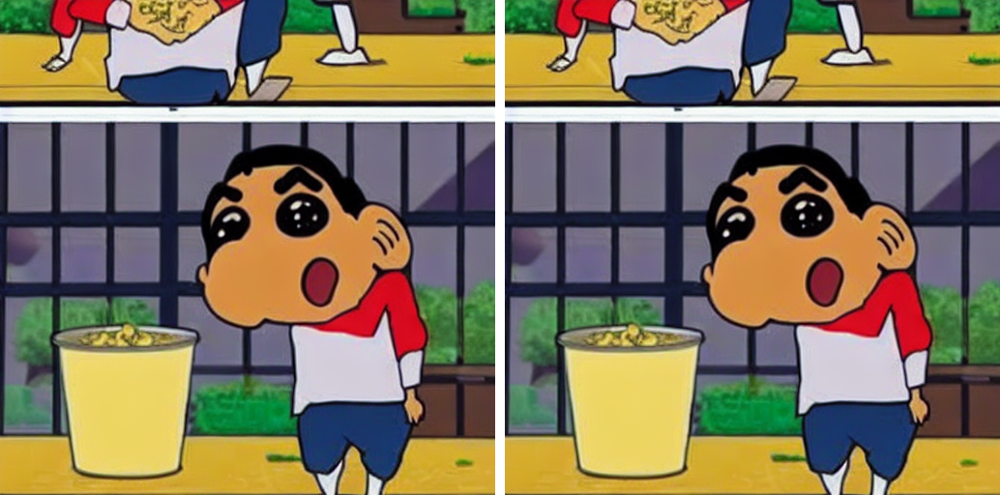

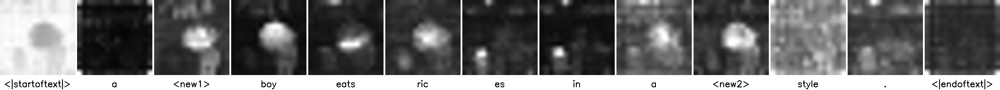

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

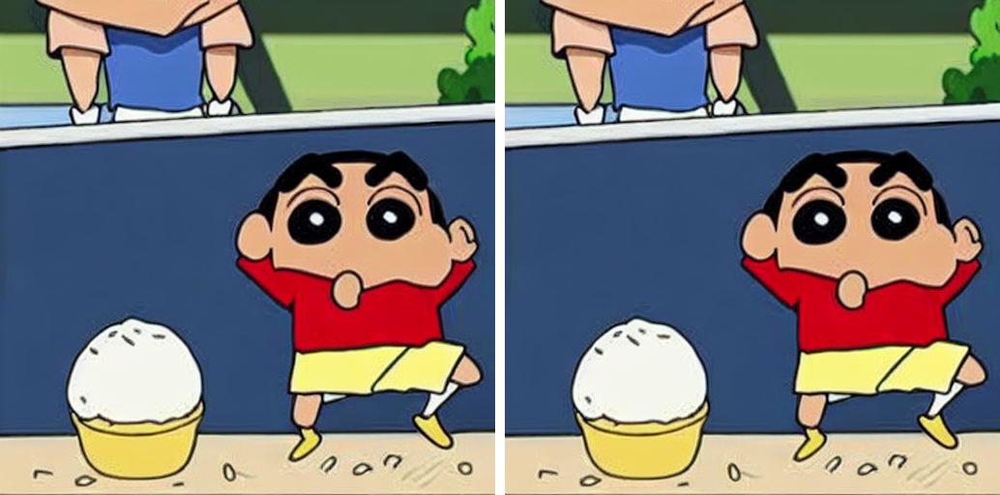

In [20]:
### [run3-1] ## [run3]과 동일한 세팅, 매번 g_cpu=torch.Generator().manual_seed(43) 선언. #### seed를 똑같이 지정하자 첫번째와 동일한 결과물이 나왔다. 

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


g_cpu = torch.Generator().manual_seed(43)
print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


g_cpu = torch.Generator().manual_seed(43)
print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:96: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (1, model.unet.in_channels, height // 8, width // 8),
/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:99: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = latent.expand(batch_size,  model.unet.in_channels, height // 8, width // 8).to(model.device)


  0%|          | 0/201 [00:00<?, ?it/s]

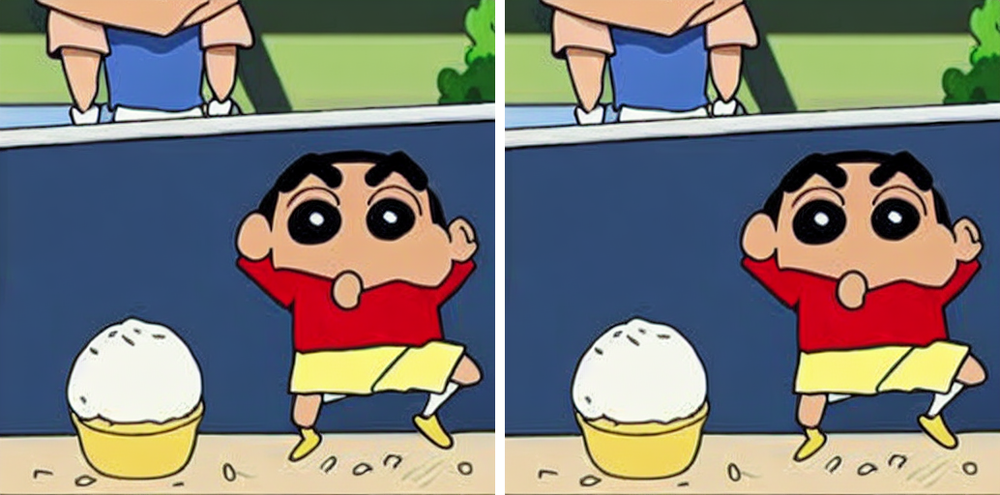

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

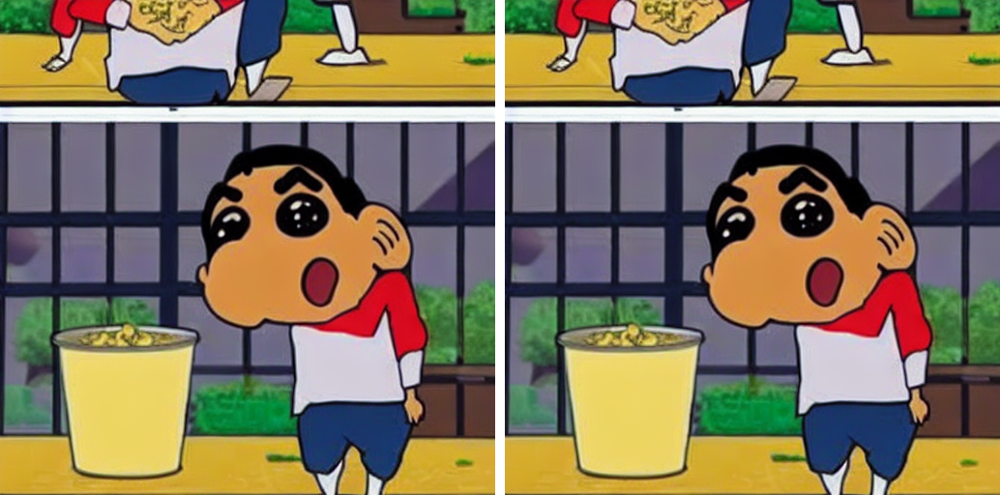

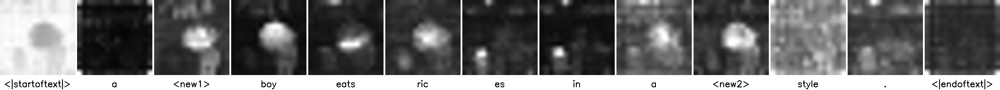

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

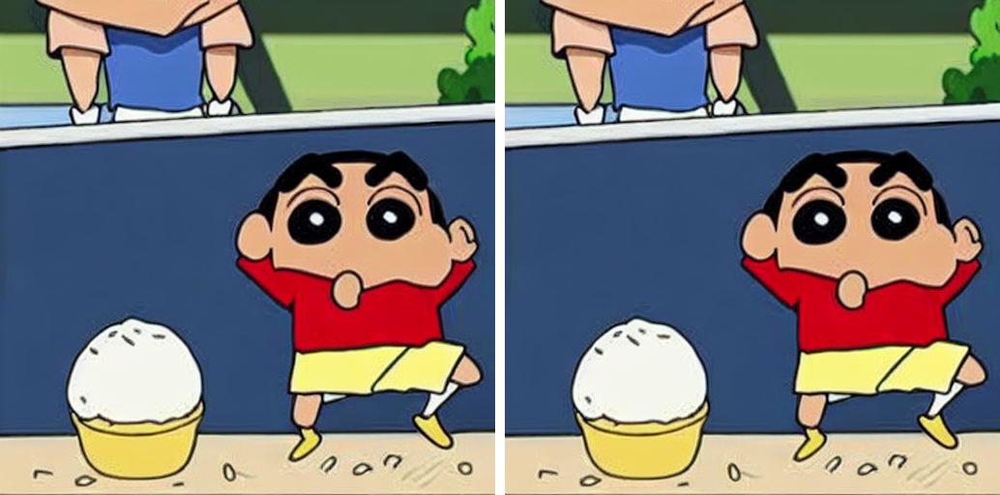

In [22]:
### [run3-2] ## latent=None, generator = g_cpu, 매번 g_cpu=torch.Generator().manual_seed(43) 선언. #### 세번째 run_and_play의 latent=None으로 바꿔도 동일한 결과물이 나왔다. 

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


g_cpu = torch.Generator().manual_seed(43)
print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


g_cpu = torch.Generator().manual_seed(43)
print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:96: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (1, model.unet.in_channels, height // 8, width // 8),
/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:99: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = latent.expand(batch_size,  model.unet.in_channels, height // 8, width // 8).to(model.device)


  0%|          | 0/201 [00:00<?, ?it/s]

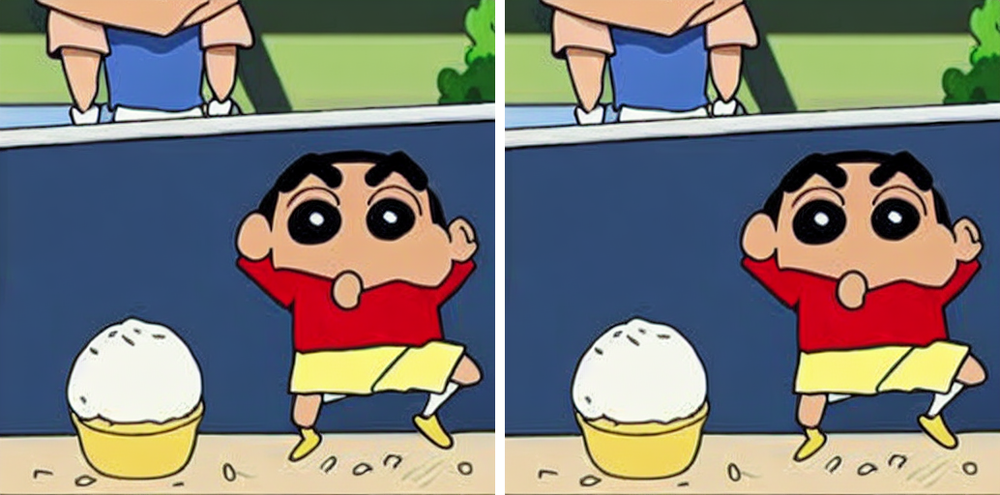

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

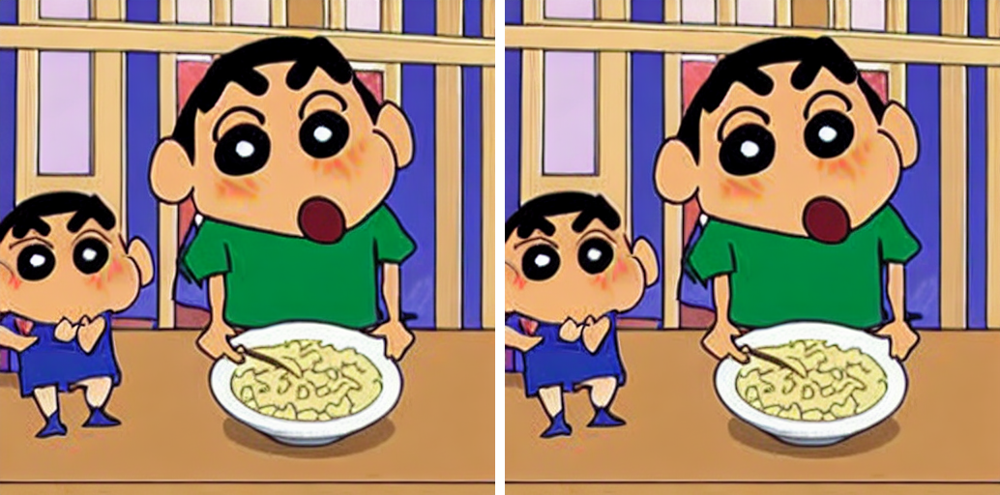

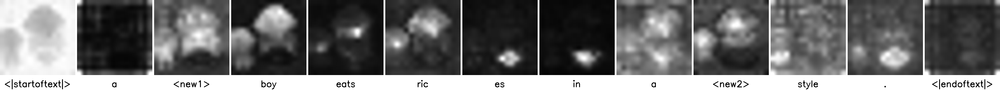

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

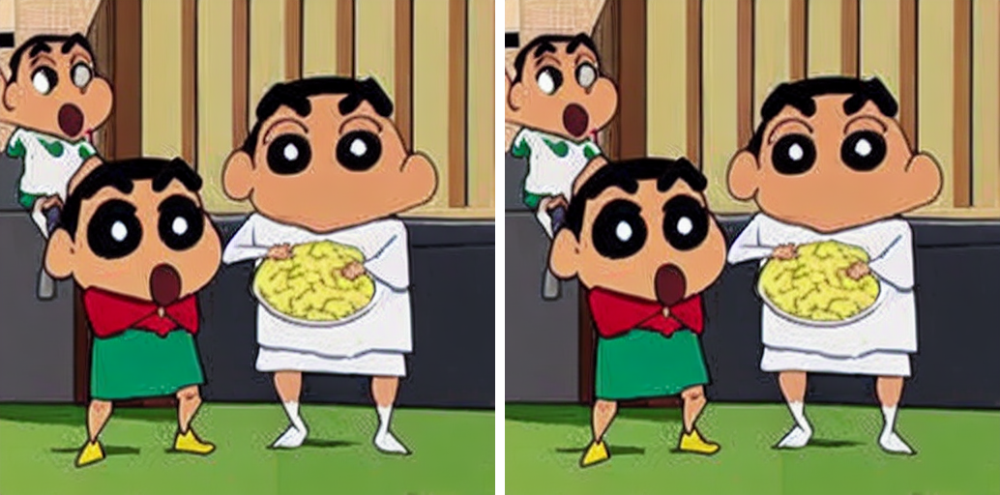

In [23]:
### [run3-3] ## latent=None, generator = g_cpu, 세번 다 2000step, controller=AttnStore() 으로 하고 돌려도 아마 내가 생각한 좋은 결과물이 나올 것이다. ####그냥 두번째 seed값에서 가장 좋은 결과가 나왔다.

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionStore()

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:96: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (1, model.unet.in_channels, height // 8, width // 8),
/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:99: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = latent.expand(batch_size,  model.unet.in_channels, height // 8, width // 8).to(model.device)


  0%|          | 0/201 [00:00<?, ?it/s]

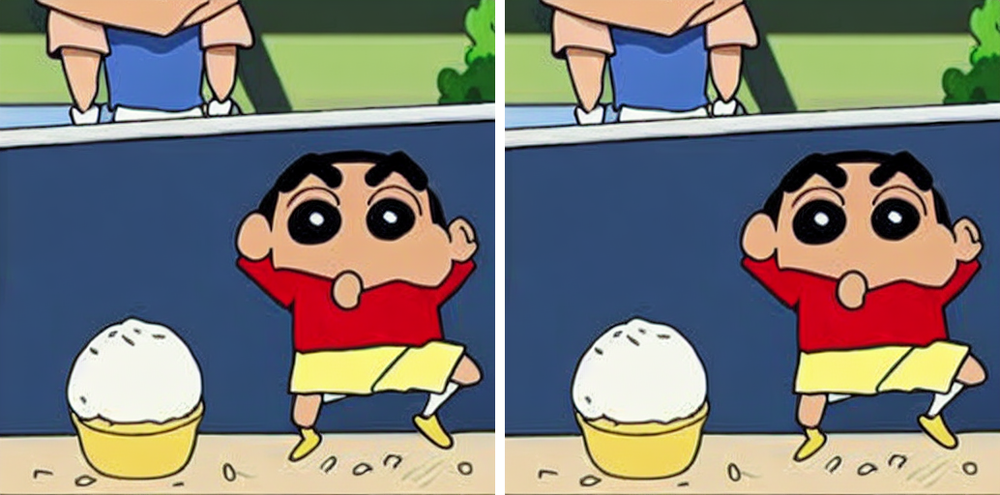

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

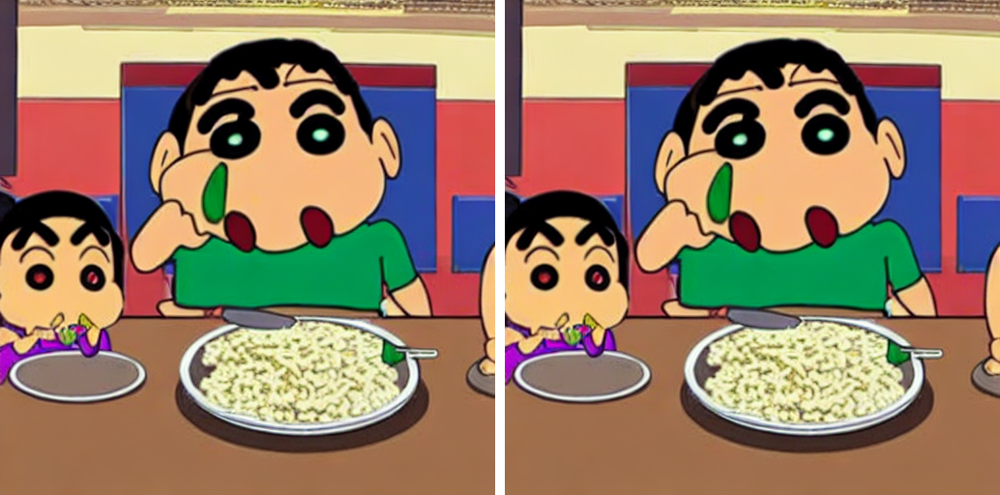

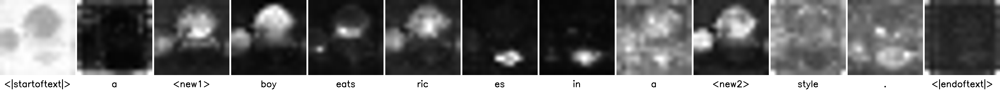

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
<class 'dict'>


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

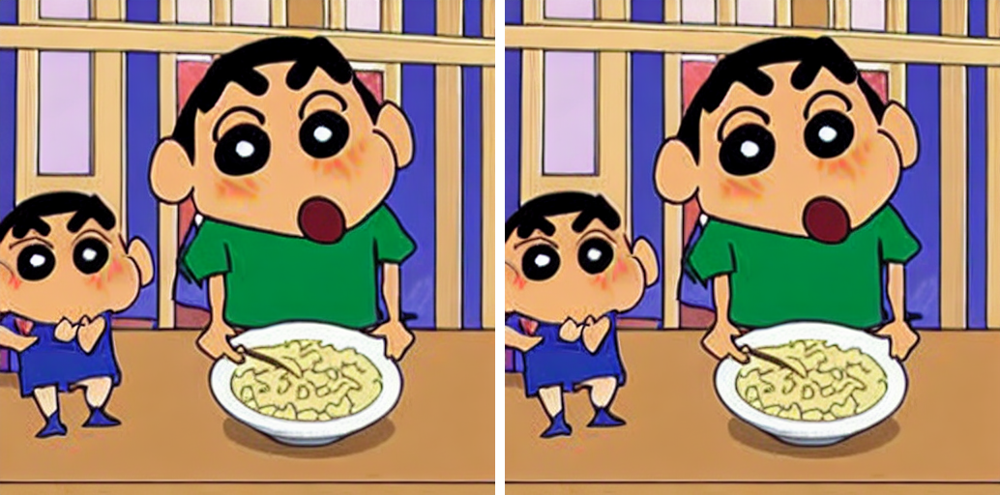

In [15]:
### [run4] # latent=x_t, generator = g_cpu, controller.attn_store = attn_store 주입 없음. #### [run3]과 같은 결과.

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(controller1, res=16, from_where=("up", "down"))


print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)

#attention_store injection
print(type(controller1.attention_store))
# pdb.set_trace()
# controller.attention_store = controller1.attention_store

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu)

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:96: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (1, model.unet.in_channels, height // 8, width // 8),
/home/work/taehyeon/CustomDiffusion_SceneRegeneration_KT_internship/_ptp_utils.py:99: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = latent.expand(batch_size,  model.unet.in_channels, height // 8, width // 8).to(model.device)


  0%|          | 0/201 [00:00<?, ?it/s]

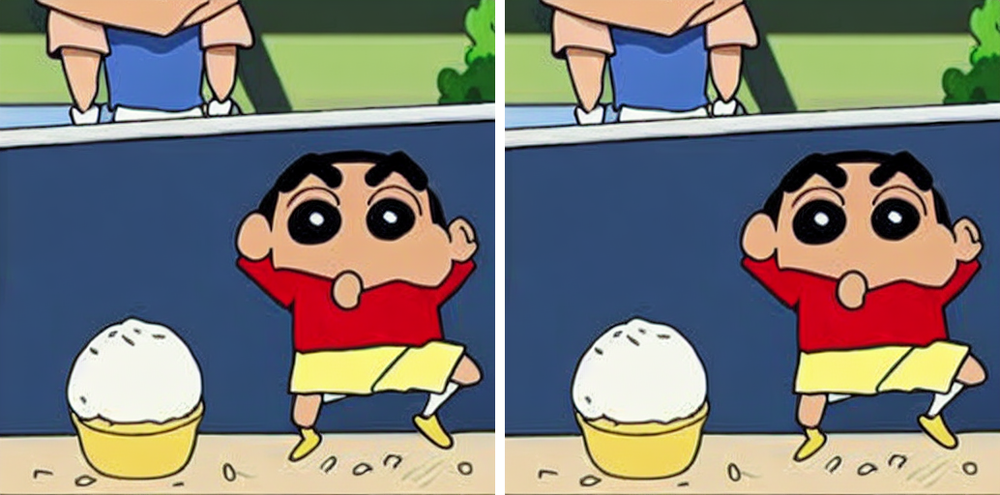

----------------------------------------
original semi fine-tuned diffusion steps
----------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

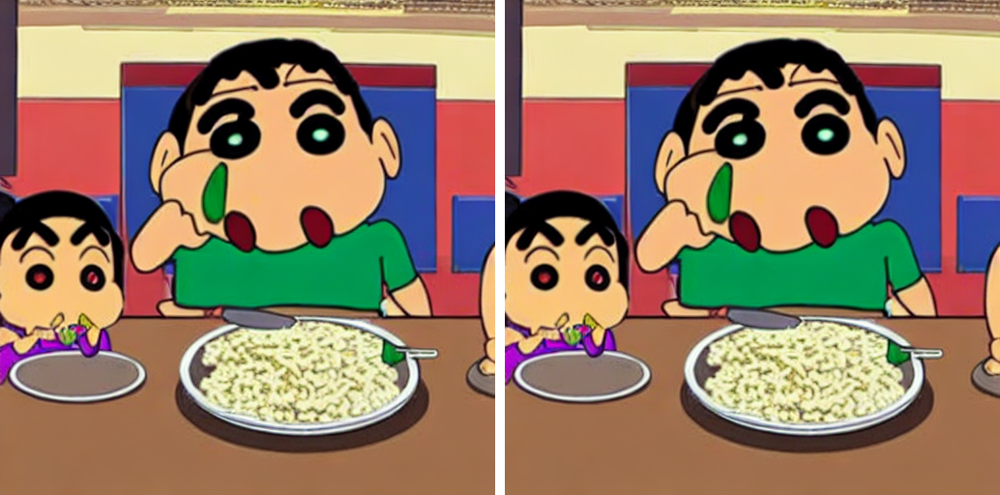

****************original step500 cross attention.*********************


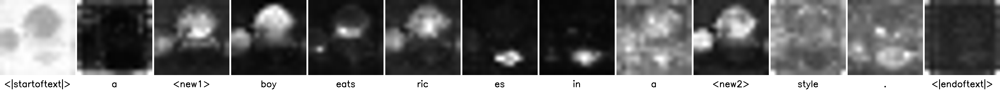

----------------------------------------------------
original semi fine-tuned diffusion steps, latent=x_t
----------------------------------------------------
******************after injection step2000 cross attention******************


/tmp/ipykernel_2192688/1434580311.py:26: RuntimeWarning: invalid value encountered in cast
  image = image.numpy().astype(np.uint8)


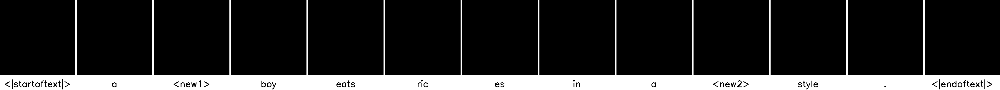

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

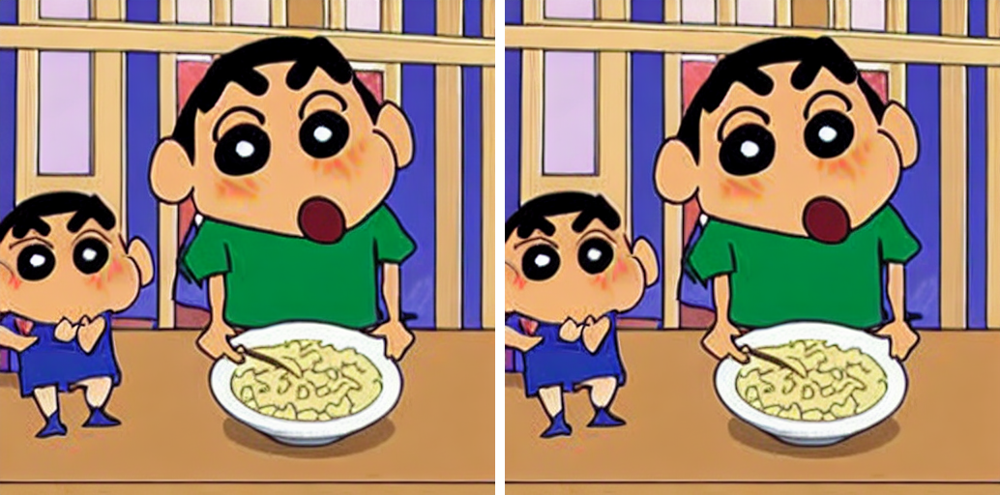

******************after run_and_display step2000 cross attention******************


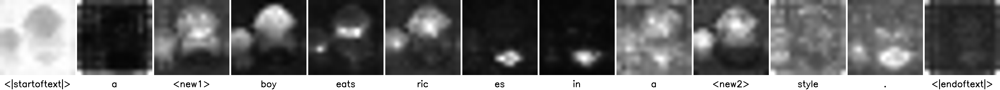

In [18]:
### [run5] # latent=x_t, generator = g_cpu, controller.attn_store 주입 전과 주입 후의 show_cross_attention 결과 비교. #### 주입이 안되는 것으로 확인

# DO NOT EREASE


# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')


print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
controller = AttentionStore()
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
_ = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)


print("----------------------------------------")
print("original semi fine-tuned diffusion steps")
print("----------------------------------------")
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
# delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer
# prompts = ["A <new1> boy eats rices in a <new2> style."]
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]
# lb = LocalBlend(prompts, ("girl", "boy"))

# fully fine-tuned model
# controller1 = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
#                               cross_replace_steps={"default_": 1.,},
#                               self_replace_steps=0.4, local_blend=lb)

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)
print("****************original step500 cross attention.*********************")
show_cross_attention(controller1, res=16, from_where=("up", "down"))


print("----------------------------------------------------")
print("original semi fine-tuned diffusion steps, latent=x_t")
print("----------------------------------------------------")
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "<new1>":.4, "boy": .4},
                              self_replace_steps=0.4)
"""print("******************random? step2000 cross attention******************")
show_cross_attention(controller, res=16, from_where=("up", "down"))""" # ####key error init되고 난 직후에는 cross attention이 아직 저장되어있지 않음. 

#attention_store injection
# print(type(controller1.attention_store))
# pdb.set_trace()
controller.attention_store = controller1.attention_store
print("******************after injection step2000 cross attention******************")
show_cross_attention(controller, res=16, from_where=("up", "down"))

delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu)
print("******************after run_and_display step2000 cross attention******************")
show_cross_attention(controller, res=16, from_where=("up", "down"))


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

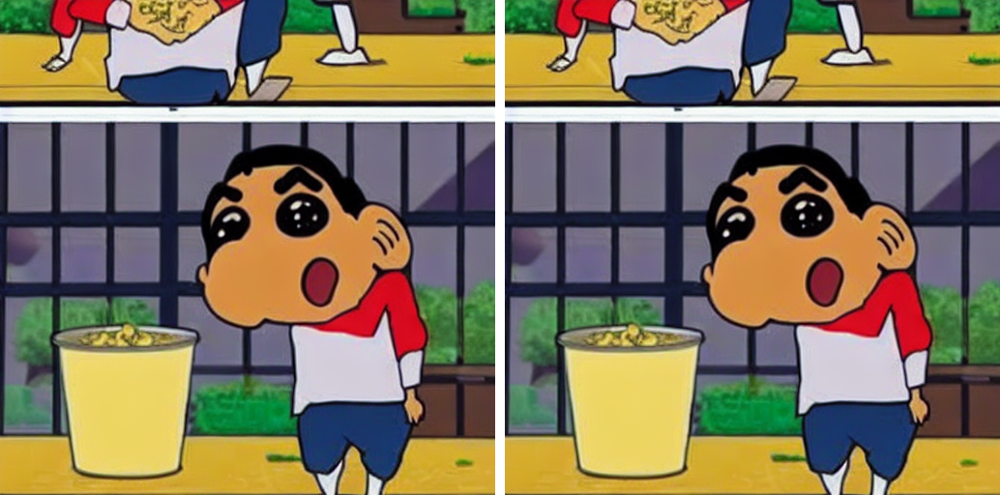

-------------------------------------------------------
original fully fine-tuned diffusion steps no latent=x_t
-------------------------------------------------------


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/201 [00:00<?, ?it/s]

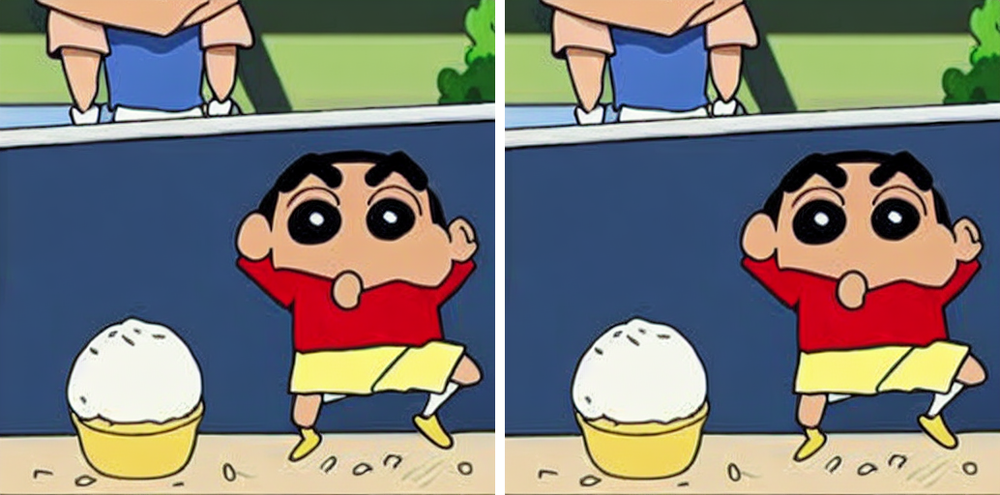

In [12]:
## x_t를 얻기 위한 코드.

# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

# <model setting>
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-500.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# <prompts>
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

controller1=AttentionStore()
image, x_t = run_and_display(prompts, controller1, latent=None, run_baseline=False, generator=g_cpu)


## 검증 1
## 모든 영향이 초기 latent를 x_t로 맞추는 것에 영향인지를 확인하는 실험. 
## 이것을 확인하기 위해 controller = AttnStore()로 두고  latent=x_t만 두고 실험을 진행한다. 

# <info>
print("-------------------------------------------------------")
print("original fully fine-tuned diffusion steps no latent=x_t")
print("-------------------------------------------------------")

# <model setting>
model_id = "CompVis/stable-diffusion-v1-4"
delta_ckpt = "./logs/jjanggu_and_scene17_b6_LR5e-6/delta-2000.bin"
compress = False
ldm_stable = CustomDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float).to("cuda")
ldm_stable.load_model(delta_ckpt, compress) # load_model is for loading modified kv_attention model.!! 
ldm_stable.safety_checker = lambda images, **kwargs: (images, [False] * len(images))
tokenizer = ldm_stable.tokenizer

# <configs>
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 200
GUIDANCE_SCALE = 6
MAX_NUM_WORDS = 77
g_cpu = torch.Generator().manual_seed(43)
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

# <prompts>
prompts = ["A <new1> boy eats rices in a <new2> style.",
           "A <new1> boy eats rices in a <new2> style."]

# <controller>
controller = AttentionStore()

# <run>
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu)